<a href="https://colab.research.google.com/github/Aarav11-vaish/Aarav11-vaish/blob/main/dog_vision_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
print("curret version: ",tf.__version__)

curret version:  2.15.0


In [ ]:
import pandas as pd
# Checkout the labels of our data
labels_csv = pd.read_csv("/content/drive/MyDrive/tensorflow_dog_vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


Text(0.5, 1.0, 'Distribution of Dog Breeds')

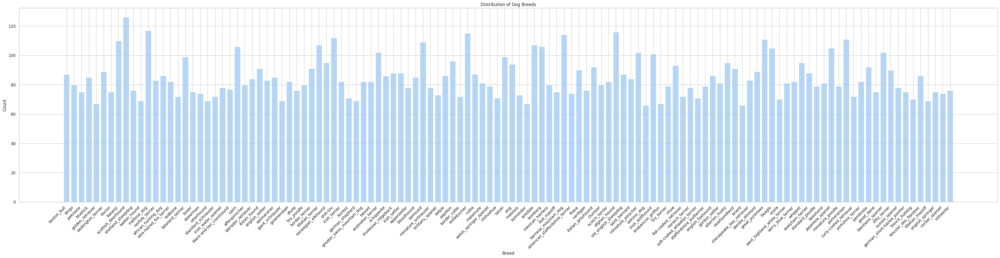

In [ ]:
# Set a stylish background using Seaborn
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid", palette="pastel")

# Increase the figure size
plt.figure(figsize=(50, 10))

# Create the histogram plot
sns.histplot(data=labels_csv, x="breed", shrink=0.8, multiple="stack")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add labels and title
plt.xlabel("Breed")
plt.ylabel("Count")
plt.title("Distribution of Dog Breeds")


In [ ]:
# Let's view an image
from IPython.display import Image
# Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breeds = np.unique(labels)

In [ ]:
filenames = ['/content/drive/MyDrive/tensorflow_dog_vision/train/' + fname + ".jpg" for fname in labels_csv["id"]]
print(filenames)
boolean_labels = [label == unique_breeds for label in labels]
# set up X and y variables
X=filenames
y=boolean_labels


['/content/drive/MyDrive/tensorflow_dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg', '/content/drive/MyDrive/tensorflow_dog_vision/train/004396df1acd0f1247b740ca2b14616e.jpg'

we are going to do experimenttion with 10000+ images

In [ ]:
#set number of images to use
NUM_IMAGES= 1000 #@param{type:"slider",min:1000,max:10000,step:1000}

# Set number of images to use for experimenting
#NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
X_train[:5]


['/content/drive/MyDrive/tensorflow_dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/tensorflow_dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/tensorflow_dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 '/content/drive/MyDrive/tensorflow_dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 '/content/drive/MyDrive/tensorflow_dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [ ]:
y_train[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
import os

file_path = '/content/drive/MyDrive/tensorflow_dog_vision/train/011e06760794850c40f23d6426c40774.jpg'
if os.path.exists(file_path):
    print("File exists.")
else:
    print("File does not exist.")


File exists.


In [ ]:
from matplotlib.pyplot import imread

image = imread(filenames[42])
print(image.shape)
# from PIL import Image

# image_path = filenames[42]
# image = Image.open(image_path)

# # Convert the image to a NumPy array if needed
# image_array = np.array(image)



(257, 350, 3)


In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  turning image into tensors

  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tf.image.decode_jpeg(tensor,channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
process_image(X[42],tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

turning datat into batches
we need to convert set of images into batches , to avoid over burden on gpu , since turning 10,000++ images to convert is tough


In [ ]:
def get_image_label(image_path,label):
  image =process_image(image_path)
  return image,label

In [ ]:
print(get_image_label(X[42],tf.constant(y[42])))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.0

In [ ]:
# Create a function to turn data into batches
BATCH_SIZE=32
def create_data_batches(X, y=None, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

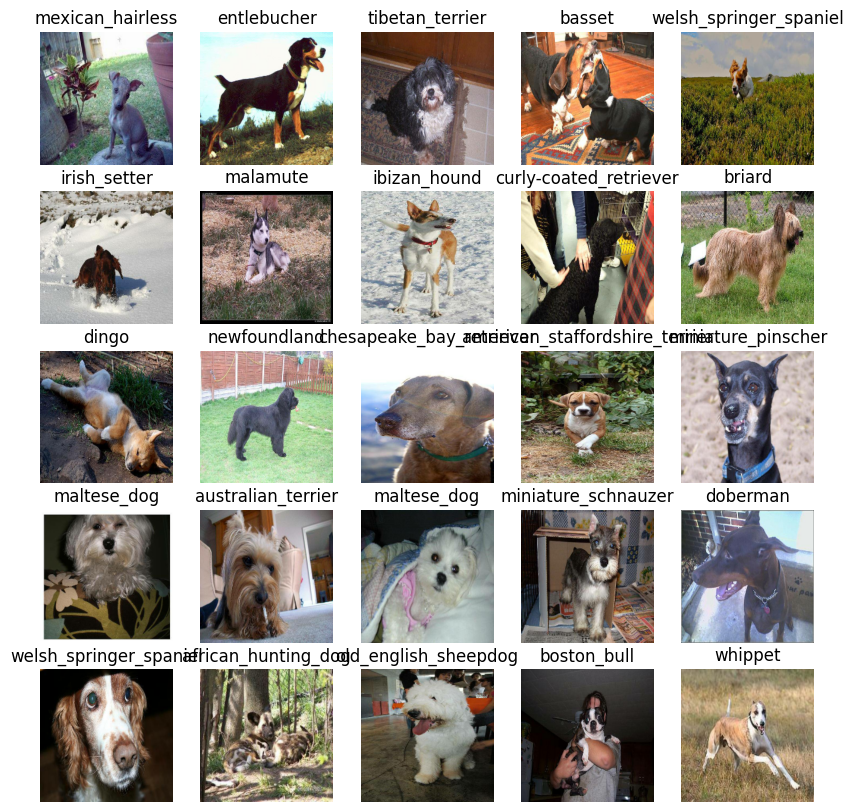

In [ ]:
import matplotlib.pyplot as plt

train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

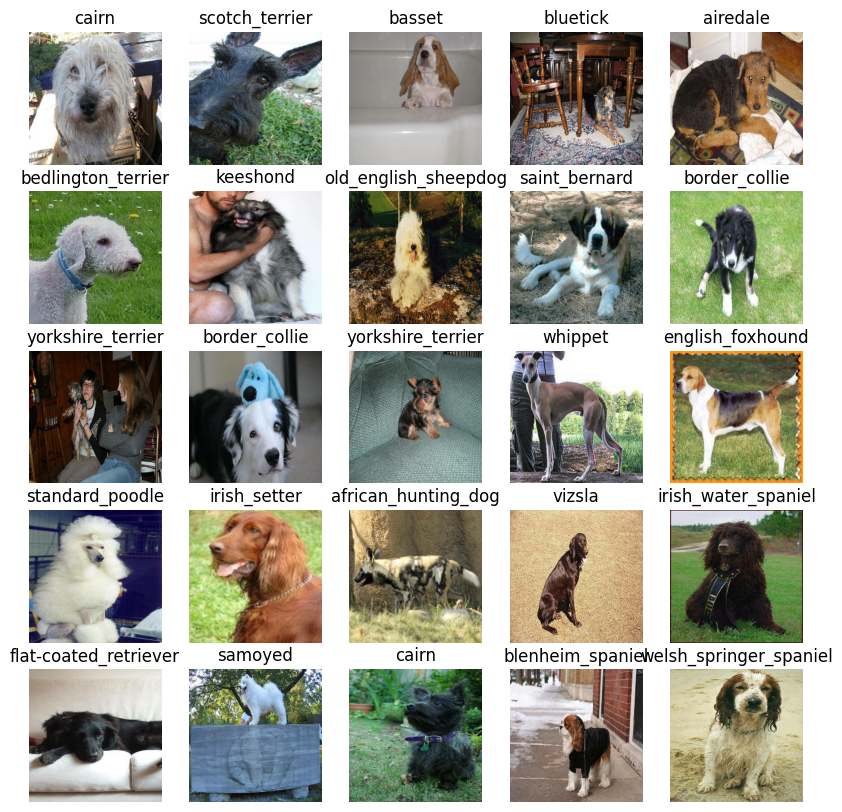

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

#building a model

before we build a model
there are few things that should be defined
input model
output model
use url
setup input shape in th e model

In [ ]:

INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
#setup output shape
OUTPUT_SHAPE=len(unique_breeds)
import tensorflow as tf
import tensorflow_hub as hub
#setting up url from tensorflow hub
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1"

In [ ]:
!wget $MODEL_URL

--2024-05-14 17:26:47--  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /models/google/mobilenet-v2/tensorFlow2/130-224-classification/1 [following]
--2024-05-14 17:26:47--  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1
Reusing existing connection to www.kaggle.com:443.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘1’

1                       [ <=>                ]   5.82K  --.-KB/s    in 0.005s  

2024-05-14 17:26:47 (1.11 MB/s) - ‘1’ saved [5956]



In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
output = np.ones(shape=(1,1,1280))
output

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
import os
import tensorflow as tf

def create_tensorboard():
    # Creating log directory
    logdir = os.path.join("drive/My Drive/tensorflow_dog_vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    # Print the log directory path
    print(f"Log directory: {logdir}")

    return tf.keras.callbacks.TensorBoard(logdir)

# Call the function to create the TensorBoard callback
tensorboard_callback = create_tensorboard()


Log directory: drive/My Drive/tensorflow_dog_vision/logs/20240514-172650


early stopping callback
stop model from overfitting

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

training model

In [ ]:
NUM_EPOX=100 #@param {type:"slider",miin:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [ ]:
def train_model():
  """ return the trained version"""

  #create the model
  model=create_model();

  #tensorboard
  tensorboard=create_tensorboard()
  # fitting
  model.fit(x=train_data,epochs=NUM_EPOX,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
model=train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1
Log directory: drive/My Drive/tensorflow_dog_vision/logs/20240514-172652
Epoch 1/100
25/25 [==============================] - 207s 8s/step - loss: 4.5704 - accuracy: 0.1025 - val_loss: 3.5518 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 161ms/step - loss: 1.6664 - accuracy: 0.6825 - val_loss: 2.2018 - val_accuracy: 0.4450
Epoch 3/100
25/25 [==============================] - 5s 217ms/step - loss: 0.5760 - accuracy: 0.9212 - val_loss: 1.6772 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2554 - accuracy: 0.9875 - val_loss: 1.5049 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 5s 190ms/step - loss: 0.1494 - accuracy: 0.9950 - val_loss: 1.4109 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 169ms/step - loss:

we will use %tensorboard to visualize log


In [ ]:
#our model is overfitting
%tensorboard --logdir /content/drive/MyDrive/tensorflow_dog_vision/logs

<IPython.core.display.Javascript object>

In [ ]:

prediction=model.predict(val_data,verbose=1)
prediction

7/7 [==============================] - 2s 113ms/step


array([[4.34482296e-04, 5.91825210e-06, 5.29711193e-04, ...,
        1.03538980e-04, 1.24582739e-05, 2.70988513e-03],
       [6.06973749e-03, 1.24465139e-03, 9.65793151e-03, ...,
        2.16222819e-04, 2.27024825e-03, 9.96174567e-05],
       [6.50550055e-06, 2.06243494e-04, 1.20813420e-04, ...,
        8.00578346e-05, 7.59550603e-05, 8.96960119e-05],
       ...,
       [3.70129612e-07, 2.31063495e-05, 1.82730491e-05, ...,
        2.12587329e-05, 1.05605366e-04, 1.30308501e-04],
       [6.63645798e-03, 4.23831370e-05, 5.39365319e-05, ...,
        9.75882285e-05, 2.82583333e-05, 5.41828107e-03],
       [3.90400091e-04, 1.40012717e-05, 9.87698004e-05, ...,
        7.01780198e-04, 4.51897882e-04, 2.27872915e-05]], dtype=float32)

In [ ]:
index=0
print(f"max value: {np.max(prediction[index])*100}")
print(f"sum: {np.sum(prediction[index])}")
print(f"max_index:{np.argmax(prediction[index])}")
print(f"prediction label: {unique_breeds[np.argmax(prediction[index])]}")

max value: 45.86564898490906
sum: 1.0000001192092896
max_index:17
prediction label: border_terrier


In [ ]:
index=1
print(f"max value: {np.max(prediction[index])}")
print(f"sum: {np.sum(prediction[index])}")
print(f"max_index:{np.argmax(prediction[index])}")
print(f"prediction label: {unique_breeds[np.argmax(prediction[index])]}")

max value: 0.6006490588188171
sum: 1.0
max_index:96
prediction label: scotch_terrier


In [ ]:
def get_preds_label(prediction_prob):
  """ turning an array of prediction probability into a label """
  return unique_breeds[np.argmax(prediction_prob)]


In [ ]:
pred_label=get_preds_label(prediction[12])
pred_label

'australian_terrier'

unbatch the dataset


In [ ]:
def unbatchify(data):
  """ take a betched dataset of(image,label) tensors and returns separate arrays of images and labels"""
  images=[]
  labels=[]
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]



(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

Prediction labels
Validation labels (truth labels)
Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
Convert the prediction probabilities to a predicted label. ✅
Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=5):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_preds_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

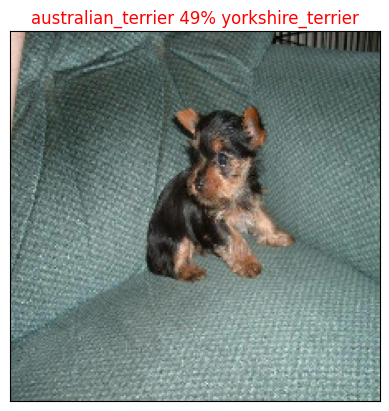

In [ ]:
plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_images,
          n=12)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_preds_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

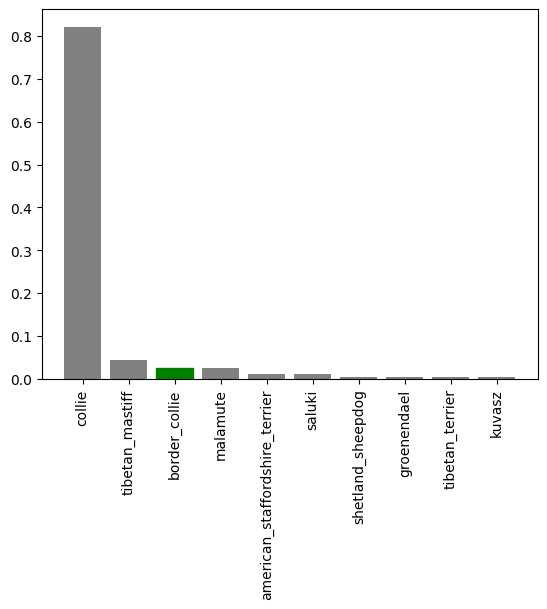

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=9)

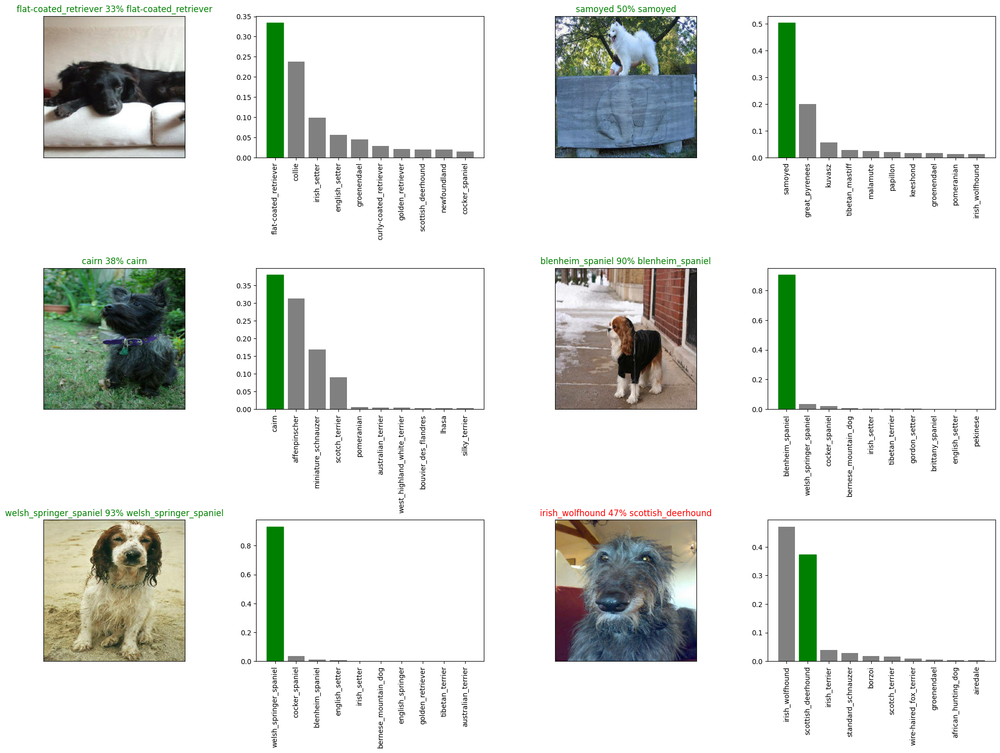

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

saving and reloading model


In [ ]:
def save_model(model,suffix=None):
  modeldir=os.path.join("/content/drive/MyDrive/tensorflow_dog_vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5"
  print(f"saving model: {model_path}...")
  model.save(model_path)

In [ ]:
# now to load the data
def load_model(model_path):
  print(f"loading data from {model_path}")
  model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

saving model: /content/drive/MyDrive/tensorflow_dog_vision/models/20240514-17311715707909-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**NOW  load the model**

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/tensorflow_dog_vision/models/20240514-17311715707909-1000-images-mobilenetv2-Adam.h5")

loading data from /content/drive/MyDrive/tensorflow_dog_vision/models/20240514-17311715707909-1000-images-mobilenetv2-Adam.h5


In [ ]:

# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.2321 - accuracy: 0.6400


[1.2320529222488403, 0.6399999856948853]

In [ ]:

# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 109ms/step - loss: 1.2321 - accuracy: 0.6400


[1.2320529222488403, 0.6399999856948853]

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training data batches...


In [ ]:
full_model=create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1


In [ ]:
full_model_tensorboard=create_tensorboard()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

Log directory: drive/My Drive/tensorflow_dog_vision/logs/20240514-173445


In [ ]:

# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOX,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2039s 6s/step - loss: 1.3319 - accuracy: 0.6692
Epoch 2/100
320/320 [==============================] - 40s 126ms/step - loss: 0.3991 - accuracy: 0.8812
Epoch 3/100
320/320 [==============================] - 42s 129ms/step - loss: 0.2342 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1546 - accuracy: 0.9636
Epoch 5/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1067 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0761 - accuracy: 0.9878
Epoch 7/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0582 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0462 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0369 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 41s 129ms

KeyboardInterrupt: 

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")


saving model: /content/drive/MyDrive/tensorflow_dog_vision/models/20240514-18191715710742-full-image-set-mobilenetv2-Adam.h5...


final loading of the model


In [ ]:
# Load in the full model
# now to load the data
import tensorflow as tf
import tensorflow_hub as hub
def load_model(model_path):
  print(f"loading data from {model_path}")
  model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model
loaded_full_model = load_model('/content/drive/MyDrive/tensorflow_dog_vision/models/20240514-18191715710742-full-image-set-mobilenetv2-Adam.h5')

loading data from /content/drive/MyDrive/tensorflow_dog_vision/models/20240514-18191715710742-full-image-set-mobilenetv2-Adam.h5


Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

Get the test image filenames. ✅
Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
import os
test_path='/content/drive/MyDrive/tensorflow_dog_vision/test/'
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:2]

['/content/drive/MyDrive/tensorflow_dog_vision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 '/content/drive/MyDrive/tensorflow_dog_vision/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg']

In [ ]:
# Create a function to turn data into batches
BATCH_SIZE=32
def create_data_batches(X, y=None, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  turning image into tensors

  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

153/324 [=============>................] - ETA: 37:32

In [ ]:
#Save predictions (NumPy array) to csv file (for access later)
import numpy as np
np.savetxt("/content/drive/MyDrive/tensorflow_dog_vision/preds_array.csv", test_predictions, delimiter=",")

NameError: name 'test_predictions' is not defined

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/tensorflow_dog_vision/preds_array.csv", delimiter=",")

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/tensorflow_dog_vision/dog-photo/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths


In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)